In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv('Electric_Vehicle_Population_Data.csv')
print(f'Shape of the data: {data.shape}')
print(f'Columns of the data: {data.columns}')
print(f'Number of missing values: {data.isnull().sum().sum()}')
print(f'Number of unique values: {data.nunique()}')
print(f'Number of duplicated values: {data.duplicated().sum()}')
data.head()

Shape of the data: (138779, 17)
Columns of the data: Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')
Number of missing values: 622
Number of unique values: VIN (1-10)                                             9211
County                                                  173
City                                                    655
State                                                    45
Postal Code                                             789
Model Year                                               22
Make                                                     36
Model                                                   126
Electric Vehicle Type                                  

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,1N4AZ0CP5D,Kitsap,Bremerton,WA,98310.0,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,0,23.0,214384901,POINT (-122.61136499999998 47.575195000000065),PUGET SOUND ENERGY INC,5.303508e+10
1,1N4AZ1CP8K,Kitsap,Port Orchard,WA,98366.0,2019,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,150,0,26.0,271008636,POINT (-122.63926499999997 47.53730000000007),PUGET SOUND ENERGY INC,5.303509e+10
2,5YJXCAE28L,King,Seattle,WA,98199.0,2020,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,293,0,36.0,8781552,POINT (-122.394185 47.63919500000003),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
3,SADHC2S1XK,Thurston,Olympia,WA,98503.0,2019,JAGUAR,I-PACE,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,234,0,2.0,8308492,POINT (-122.8285 47.03646),PUGET SOUND ENERGY INC,5.306701e+10
4,JN1AZ0CP9B,Snohomish,Everett,WA,98204.0,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,21.0,245524527,POINT (-122.24128499999995 47.91088000000008),PUGET SOUND ENERGY INC,5.306104e+10


<li>Identifying top selling EV models nationally or by location.
<li>Assessing factors that predict EV adoption rates in a region.
<li>Determining if EV pricing is associated with factors like range.
<li>Comparing EV adoption over time using model year.
<li>Finding optimal locations for new EV charging stations based on demand.

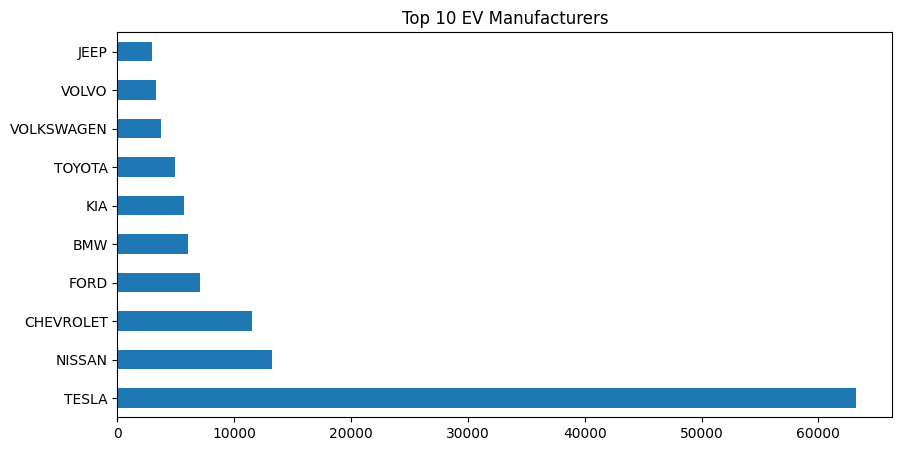

In [3]:
# who sells the most EVs?
data['Make'].value_counts().head(10).plot(kind='barh', figsize=(10, 5), title='Top 10 EV Manufacturers')
plt.show()

# Ofcourse, Tesla !!

<Axes: title={'center': 'Top 10 EV Models'}>

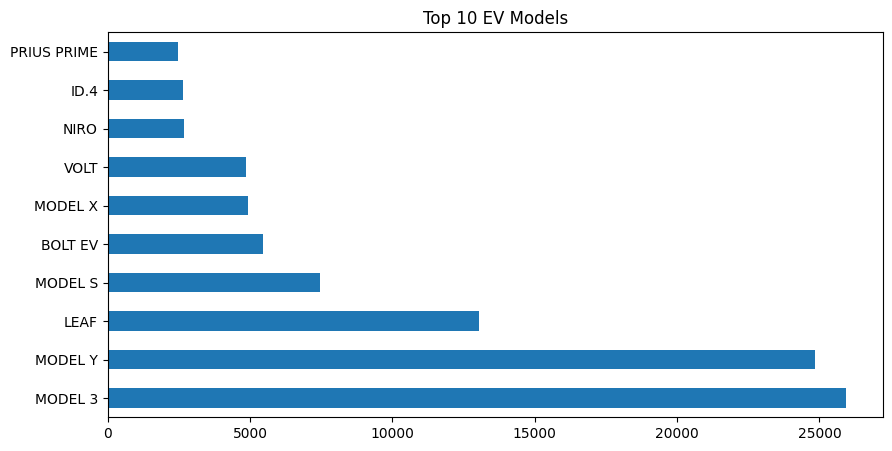

In [4]:
# Top 10 EV models nationally
data['Model'].value_counts().head(10).plot(kind='barh', figsize=(10, 5), title='Top 10 EV Models')

# TBH I like Model 3, but If I have the money, I might buy a Rubicon 4Xe

<Axes: title={'center': 'Top 10 Counties to buy EVs'}>

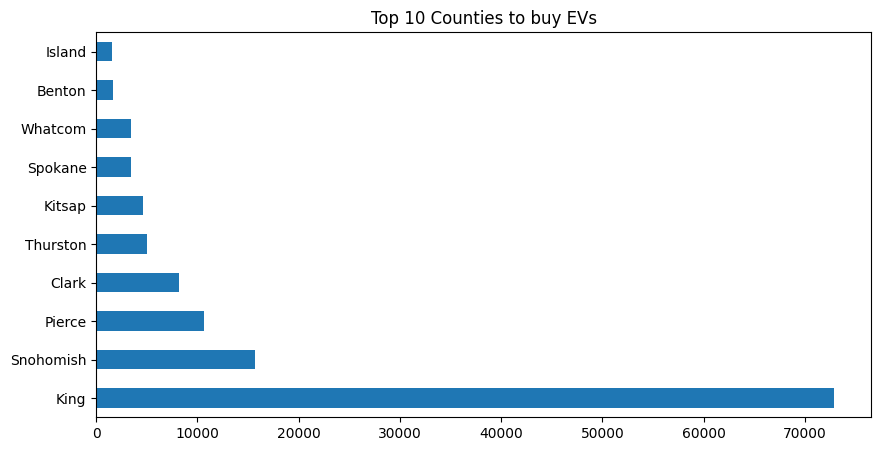

In [5]:
# Top locations to buy EVs
data['County'].value_counts().head(10).plot(kind='barh', figsize=(10, 5), title='Top 10 Counties to buy EVs')

In [6]:
king_df = data[data['County'] == 'King']
king_df.sample(1)

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
133630,KMHM34AC3P,King,Federal Way,WA,98023.0,2023,HYUNDAI,IONIQ 6,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,30.0,238035983,POINT (-122.36362999999994 47.30675000000008),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303303e+10


# King, Covington, Washington is the place that buys the most EVs, That's actually cool!. <br /> The gap in the number of EVs among the King and second place Snohomish is way too off

<Axes: title={'center': 'Top 10 EV Models in King County'}>

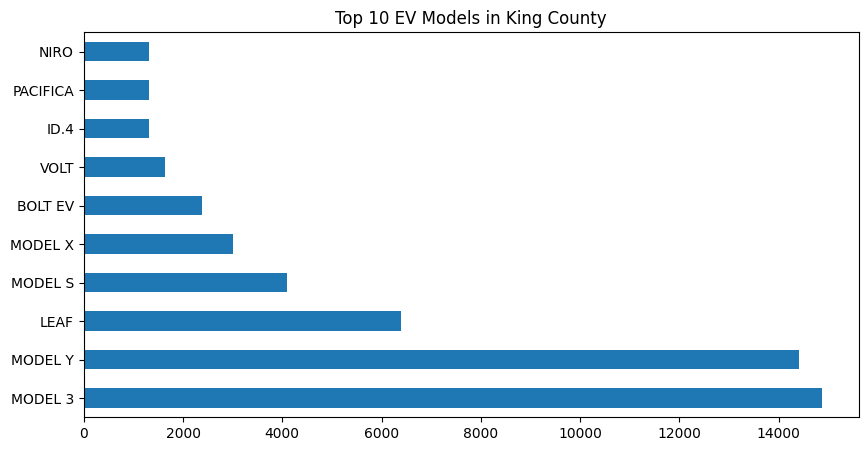

In [7]:
# Top 10 EV models in King County
king_df['Model'].value_counts().head(10).plot(kind='barh', figsize=(10, 5), title='Top 10 EV Models in King County')

# There are a lot of Rich people in King County, they don't like Toyota Prius that much lol

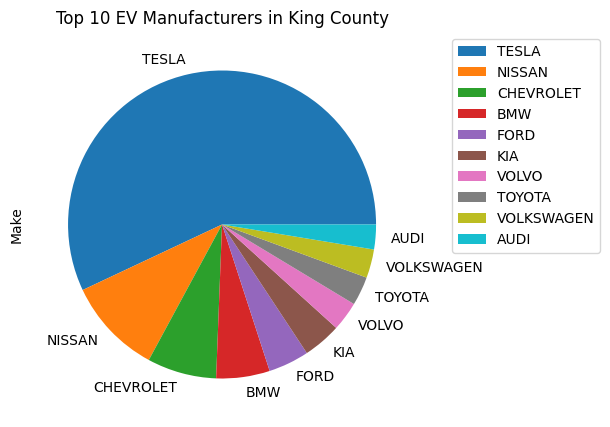

In [8]:
# pie chart of companies in King County
king_df['Make'].value_counts().head(10).plot(kind='pie', figsize=(10, 5), title='Top 10 EV Manufacturers in King County')
plt.legend(loc='upper right', bbox_to_anchor=(1.5, 1))

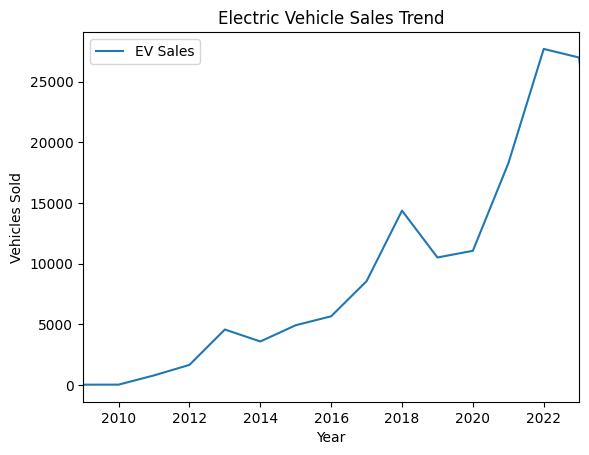

In [9]:
# Group by model year and count EVs
ev_by_year = data.groupby('Model Year').size().reset_index(name='EV Sales')

# Plot EV sales over time
ev_by_year.plot(x='Model Year', y='EV Sales', kind='line')

plt.title('Electric Vehicle Sales Trend')
plt.xlabel('Year')
plt.ylabel('Vehicles Sold')
plt.xlim(2009,2023)

plt.show()

# In 2020, EV market skyrocketed as the flow of investors pouring money into EV's stock and associated financial products helped finance its investments into manufacturing infrastructure

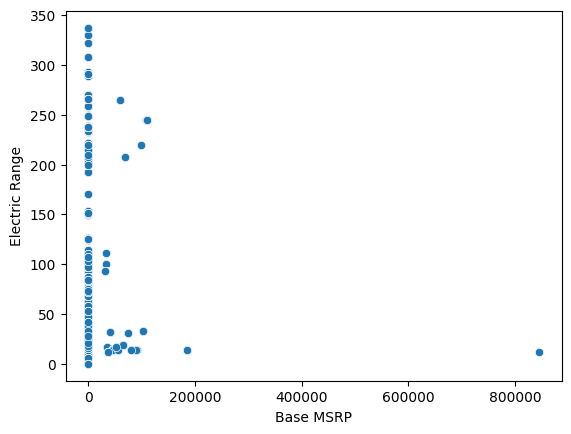

In [10]:
# Determining if EV pricing is associated with factors like range.

# Create a scatter plot of EV price vs. range
ax= sns.scatterplot(x='Base MSRP', y='Electric Range', data=data)

As a lot of subsidies were introduced to buy EVs at Base MSRP of zero, EV base price is not a factor of Electric Range

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 138779 entries, 0 to 138778
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         138779 non-null  object 
 1   County                                             138776 non-null  object 
 2   City                                               138776 non-null  object 
 3   State                                              138779 non-null  object 
 4   Postal Code                                        138776 non-null  float64
 5   Model Year                                         138779 non-null  int64  
 6   Make                                               138779 non-null  object 
 7   Model                                              138493 non-null  object 
 8   Electric Vehicle Type                              138779 non-null  object

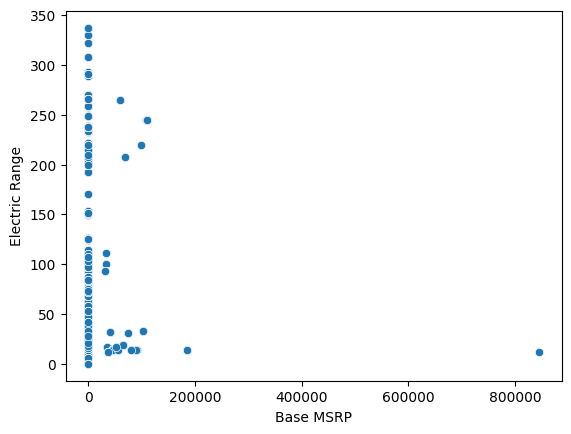

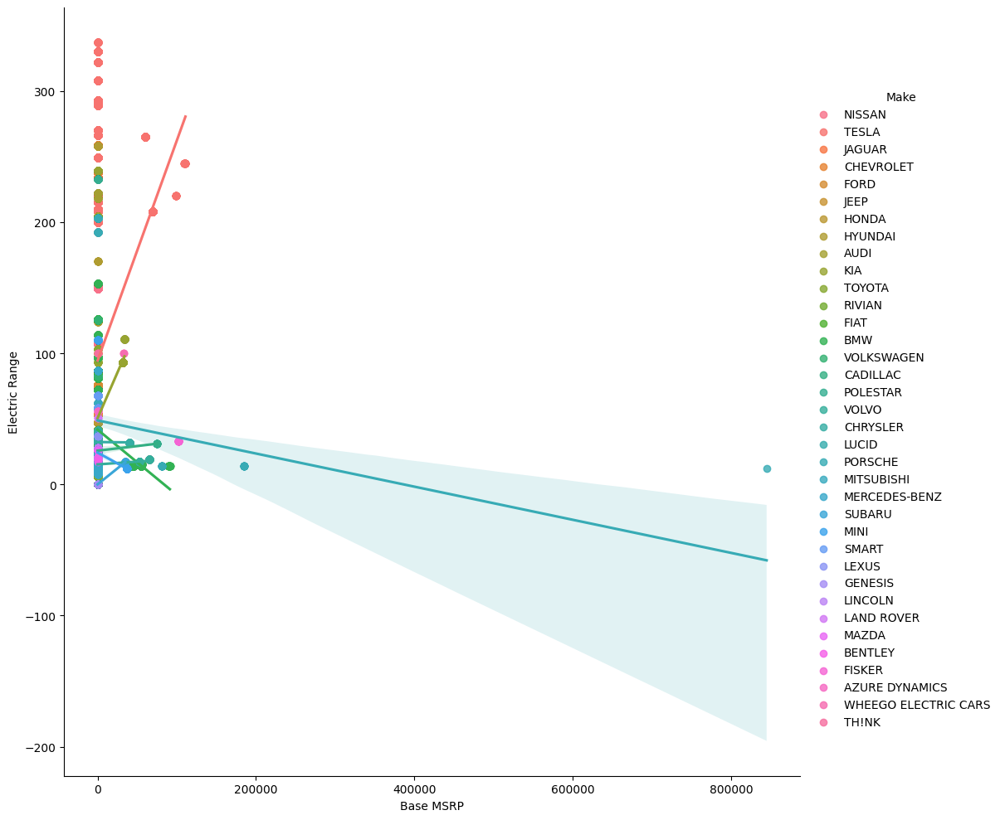

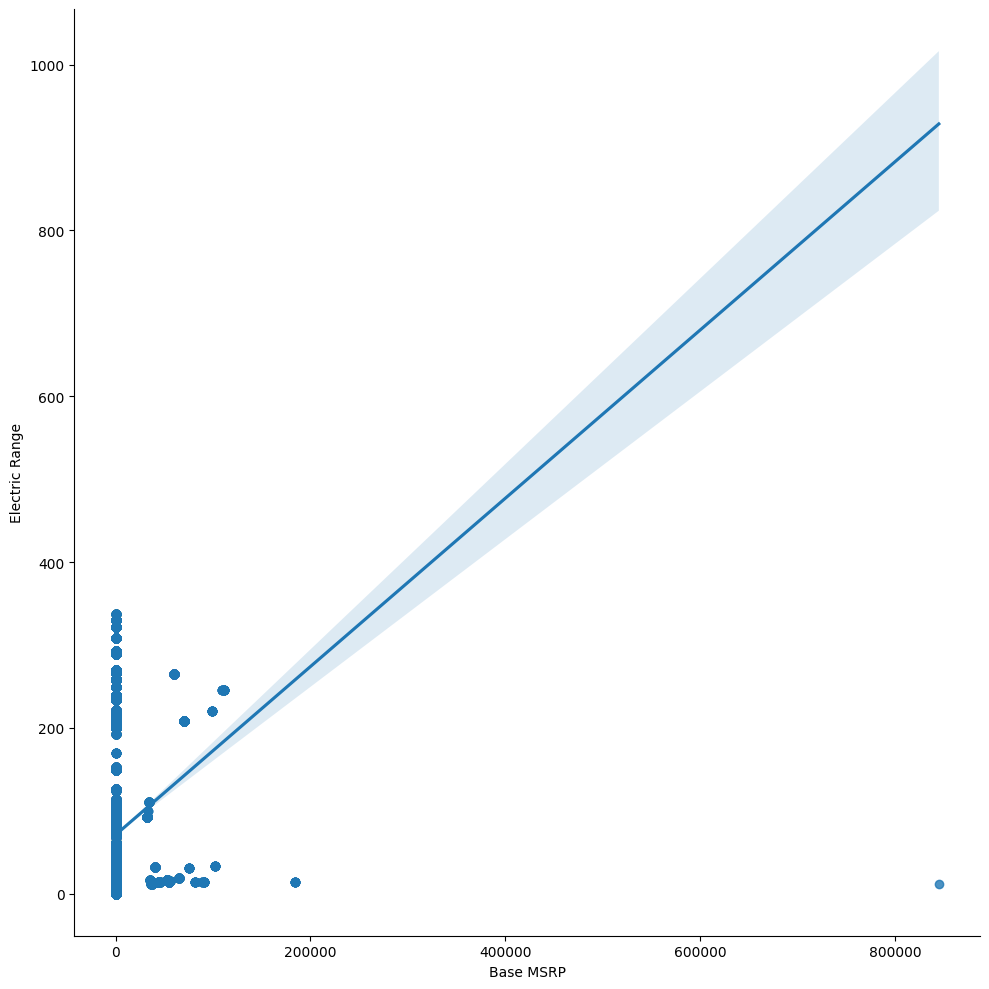

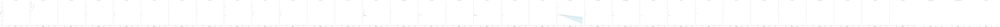

In [12]:
# Analyze the relationship between EV price, range, and demand. Build regression models to understand consumer preferences

# Create a scatter plot of EV price vs. range
ax = sns.scatterplot(x='Base MSRP', y='Electric Range', data=data)

# Create a regression plot using hue
ax = sns.lmplot(x='Base MSRP', y='Electric Range', data=data, hue='Make', height=10)

# Create a regression plot without using hue
ax = sns.lmplot(x='Base MSRP', y='Electric Range', data=data, height=10)

# Create a regression plot using hue and col
ax = sns.lmplot(x='Base MSRP', y='Electric Range', data=data, hue='Make', col='Make', height=10)

              Base MSRP  EV Sales  Electric Range
County                                           
Adams                 0        41            21.0
Alameda               0         3             0.0
Alexandria            0         4            10.5
Allen                 0         1           210.0
Anne Arundel          0        11             0.0


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


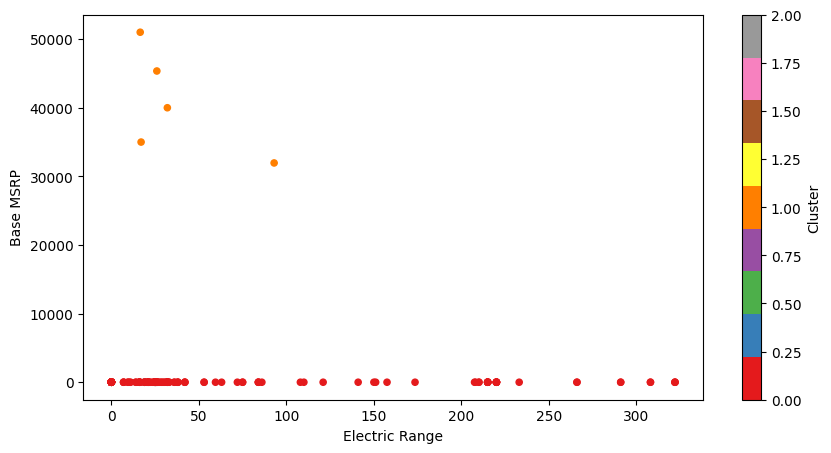

In [13]:
# Cluster geographic regions (cities, counties, zip codes, census tracts) based on EV penetration and characteristics. Identify leading and lagging EV adoption areas.

# Create a new dataframe with EV sales by county
ev_sales_by_county = data.groupby('County').size().reset_index(name='EV Sales')

# Merge the ev_sales_by_county dataframe with the data dataframe
ev_sales_by_county = ev_sales_by_county.merge(data, on='County')

# Create a pivot table with the median EV sales by county and EV characteristics
ev_sales_by_county_pivot = ev_sales_by_county.pivot_table(values=['EV Sales', 'Electric Range', 'Base MSRP'], index='County', aggfunc='median')

# Print the first rows of the pivot table
print(ev_sales_by_county_pivot.head())

# Import KMeans from sklearn
from sklearn.cluster import KMeans

# Create a list of the columns to cluster
cluster_cols = ['EV Sales', 'Electric Range', 'Base MSRP']

# Create clusters
kmeans = KMeans(n_clusters=3).fit(ev_sales_by_county_pivot[cluster_cols])

# Create a new column with the cluster labels
ev_sales_by_county_pivot['Cluster'] = kmeans.labels_

# Create a scatter plot of the median EV characteristics
ev_sales_by_county_pivot.plot(kind='scatter', x='Electric Range', y='Base MSRP', c='Cluster', colormap='Set1', figsize=(10, 5))
plt.show()

In [14]:
import re
# Extract coordinates with regex
lat_lon_pattern = re.compile("(\-?\d+\.\d+) (\-?\d+\.\d+)")

data["Latitude"] = data["Vehicle Location"].str.extract(lat_lon_pattern, expand=False)[0]
data["Longitude"] = data["Vehicle Location"].str.extract(lat_lon_pattern, expand=False)[1]

# Verify latitude and longitude columns created
print(data["Latitude"].head())

0    -122.61136499999998
1    -122.63926499999997
2            -122.394185
3              -122.8285
4    -122.24128499999995
Name: Latitude, dtype: object


In [15]:
import plotly.express as px

data['Latitude'] = data['Latitude'].astype(float)
data['Longitude'] = data['Longitude'].astype(float)

data['Electric Range'] = data['Electric Range'].astype(str)
data['Base MSRP'] = data['Base MSRP'].astype(str)

fig = px.scatter_mapbox(data, lat="Latitude", lon="Longitude",
                        hover_name="Model", hover_data=["Make", "Electric Range", "Base MSRP"],
                        color_discrete_sequence=["fuchsia"],height=300)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.



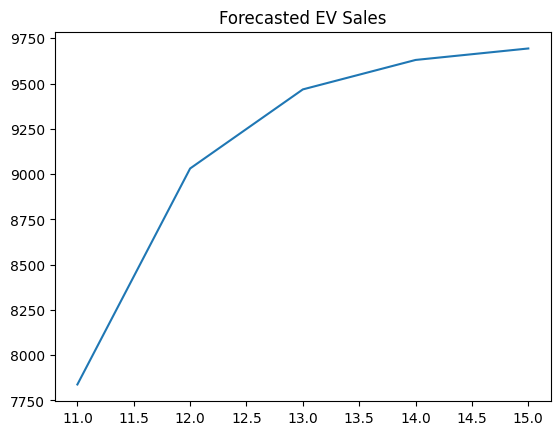

In [16]:
# forecasting EV sales in Washington State for the next 5 years.

import statsmodels.api as sm

# create a time series of EV sales in Washington State
ev_sales = data.groupby('Model Year').size().reset_index(name='EV Sales')

model = sm.tsa.statespace.SARIMAX(ev_sales['EV Sales'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
results = model.fit()

# forecast EV sales for the next 5 years
ev_forecast = results.predict(start=11, end=15, dynamic=True)

# plot the forecasted EV sales
ev_forecast.plot(kind='line', title='Forecasted EV Sales')
plt.show()

In [26]:
from sklearn.metrics.pairwise import cosine_similarity

In [25]:
# Handle missing values
data.fillna(0, inplace=True)

# Feature columns
features = ['Make', 'Model', 'Electric Range', 'Base MSRP']

# Create features DataFrame
ev_features = data[features].drop_duplicates()

# Pivot features on Make/Model
ev_pivoted = ev_features.pivot_table(index=['Make','Model'], values=['Electric Range', 'Base MSRP'], aggfunc='median').reset_index()

# Function to get recommendations
def recommend(price, min_range):

  # Add user input as new row
  new_row = {'Make':'USER', 'Model':'INPUT', 'Electric Range':min_range, 'Base MSRP':price}
  global ev_pivoted
  ev_pivoted = ev_pivoted.append(new_row, ignore_index=True)

  # Calculate similarity
  sim_matrix = cosine_similarity(ev_pivoted.drop(['Make','Model'], axis=1))

  # Add similarities
  ev_pivoted['Similarity'] = sim_matrix[-1]

  # Recommend top 5
  recommendations = ev_pivoted.sort_values('Similarity', ascending=False).head(5)

  print(recommendations[['Make', 'Model', 'Electric Range', 'Base MSRP']])

# Example usage
recommend(price=30000, min_range=150)

                     Make     Model  Electric Range  Base MSRP
127                  USER     INPUT           150.0    30000.0
64                    KIA      SOUL            93.0    15975.0
126  WHEEGO ELECTRIC CARS    WHEEGO           100.0    32995.0
65                    KIA   SOUL EV            93.0    32250.0
108                 TESLA  ROADSTER           245.0   109000.0


<ipython-input-25-16a47a75d4ac>:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

